In [120]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sklearn
import seaborn as sns

import sklearn 
import plotly.express as px
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
from sklearn.pipeline import Pipeline

from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
import time

pd.options.display.max_columns = None
pd.options.display.max_rows = None

In [121]:
train=pd.read_csv('train.csv')
test=pd.read_csv('test.csv')
train.head()

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Transported
0,0001_01,Europa,False,B/0/P,TRAPPIST-1e,39.0,False,0.0,0.0,0.0,0.0,0.0,Maham Ofracculy,False
1,0002_01,Earth,False,F/0/S,TRAPPIST-1e,24.0,False,109.0,9.0,25.0,549.0,44.0,Juanna Vines,True
2,0003_01,Europa,False,A/0/S,TRAPPIST-1e,58.0,True,43.0,3576.0,0.0,6715.0,49.0,Altark Susent,False
3,0003_02,Europa,False,A/0/S,TRAPPIST-1e,33.0,False,0.0,1283.0,371.0,3329.0,193.0,Solam Susent,False
4,0004_01,Earth,False,F/1/S,TRAPPIST-1e,16.0,False,303.0,70.0,151.0,565.0,2.0,Willy Santantines,True


In [122]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8693 entries, 0 to 8692
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   PassengerId   8693 non-null   object 
 1   HomePlanet    8492 non-null   object 
 2   CryoSleep     8476 non-null   object 
 3   Cabin         8494 non-null   object 
 4   Destination   8511 non-null   object 
 5   Age           8514 non-null   float64
 6   VIP           8490 non-null   object 
 7   RoomService   8512 non-null   float64
 8   FoodCourt     8510 non-null   float64
 9   ShoppingMall  8485 non-null   float64
 10  Spa           8510 non-null   float64
 11  VRDeck        8505 non-null   float64
 12  Name          8493 non-null   object 
 13  Transported   8693 non-null   bool   
dtypes: bool(1), float64(6), object(7)
memory usage: 891.5+ KB


Feature descriptions

    PassengerId : A unique Id for each passenger. Each Id takes the form gggg_pp where gggg indicates a group the passenger is travelling with and pp is their number within the group. People in a group are often family members, but not always.
    
    HomePlanet : The planet the passenger departed from, typically their planet of permanent residence.
    
    CryoSleep : Indicates whether the passenger elected to be put into suspended animation for the duration of the voyage. Passengers in cryosleep are confined to their cabins.
    
    Cabin : The cabin number where the passenger is staying. Takes the form deck/num/side, where side can be either P for Port or S for Starboard.
    
    Destination : The planet the passenger will be debarking to.
    
    Age : The age of the passenger.
    
    VIP : Whether the passenger has paid for special VIP service during the voyage.
    RoomService, FoodCourt, ShoppingMall, Spa, VRDeck - Amount the passenger has billed at each of the Spaceship Titanic's many luxury amenities.
    
    Name : The first and last names of the passenger.
    
    Transported : Whether the passenger was transported to another dimension. This is the target, the column you are trying to predict.

In [123]:
px.imshow(train.isna(),title="Null Heatmap")

As we can see there is no singular column that has too many null values, we will fill these column-by-column

# Let us first do some Exploratory data analysis

In [124]:
# the categorical features are
cat_feats=['HomePlanet', 'CryoSleep', 'Destination', 'VIP']
px.histogram(
    train,
    x='CryoSleep',
    color='Transported',
    barmode='group',
    width=500,
    height=500
)

In [125]:
px.histogram(
    train,
    x='HomePlanet',
    color='Transported',
    barmode='group',
    width=600,
    height=600,
    title="Home PLanet"
)

In [126]:
px.histogram(
    train,
    x='Destination',
    color='Transported',
    barmode='group',
    width=600,
    height=600
)

In [127]:
px.histogram(
    train,
    x='VIP',
    color='Transported',
    barmode='group',
    width=600,
    height=600
)

Notes:

    1. The most Home Planet among the passengers is Earth, however we can't use it to fill the missing values as the no of poeple from europa and mars is significant
    
    2. The most common destination among the passengers is TRAPPIST-1e where about 69.5% of the people are going
    
    3. Most of the passengers (97.5%) are not VIPs but the target split is more or less the same i.e. 50% transported and 50% not in either categiry
    
    4. Only 35.8% of the people opted for cryosleep
    
Inference:

     1.VIP column can be dropped to avoid overfitting 
    
    

In [128]:
px.histogram(
    train,
    x='Age',
    color='Transported',
    marginal='box',
    color_discrete_sequence=['turquoise','blue']
)

The age is a left skewed Normal distribution

In [129]:
fig=make_subplots(
    rows=5,
    cols=1,
)
fig.add_trace(go.Violin(x=train['FoodCourt'],name='Food Court'),row=5,col=1)
fig.add_trace(go.Violin(x=train['FoodCourt'],name='Food Court'),row=1,col=1)
fig.add_trace(go.Violin(x=train['ShoppingMall'],name='Shopping Mall'),row=2,col=1)
fig.add_trace(go.Violin(x=train['Spa'],name='Spa'),row=3,col=1)
fig.add_trace(go.Violin(x=train['VRDeck'],name='VR Deck'),row=4,col=1)

fig.show()

As we can see this data has a very wide range we will need to apply log transformation to it, we shall do this later

**Qualitative Features**


We need to draw more useful features from this before plotting it

In [130]:
qual=['PassengerId', 'Cabin' ,'Name']
train[qual].head(5)

,PassengerId,Cabin,Name
0,0001_01,B/0/P,Maham Ofracculy
1,0002_01,F/0/S,Juanna Vines
2,0003_01,A/0/S,Altark Susent
3,0003_02,A/0/S,Solam Susent
4,0004_01,F/1/S,Willy Santantines


Notes:

    1. PassengerID takes the form of gggg_pp where gggg indicated the group a passenger belongs to and pp indicates the no within the group
    
    2. The cabin has a format of Deck/Num/Side
    
    
Inference:
    
    1.We can extract group and groupsize from PassengerId
    
    2.We can extract deck and side from Cabin
    
    3. Sirname can be used to identify families

# Feature Engineering

Here, we try to increase the no of existing features by deriving new ones from existing features and trends

**Age status**

Bin age feature into groups. This will be helpful for filling missing values like expenditure according to age.

In [131]:
train['Age_group']=np.nan
train.loc[train['Age']<=12,'Age_group']='Age_0-12'
train.loc[(train['Age']>12) & (train['Age']<18),'Age_group']='Age_13-17'
train.loc[(train['Age']>=18) & (train['Age']<=25),'Age_group']='Age_18-25'
train.loc[(train['Age']>25) & (train['Age']<=30),'Age_group']='Age_26-30'
train.loc[(train['Age']>30) & (train['Age']<=50),'Age_group']='Age_31-50'
train.loc[train['Age']>50,'Age_group']='Age_51+'

test['Age_group']=np.nan
test.loc[test['Age']<=12,'Age_group']='Age_0-12'
test.loc[(test['Age']>12) & (test['Age']<18),'Age_group']='Age_13-17'
test.loc[(test['Age']>=18) & (test['Age']<=25),'Age_group']='Age_18-25'
test.loc[(test['Age']>25) & (test['Age']<=30),'Age_group']='Age_26-30'
test.loc[(test['Age']>30) & (test['Age']<=50),'Age_group']='Age_31-50'
test.loc[test['Age']>50,'Age_group']='Age_51+'

In [132]:
px.histogram(train, 
             x='Age_group',
             color='Transported',
             barmode='group',
            )

**Expenditure**

We will calculate the total expenditure and using RoolService, Spa etc and calculate the passengers with no expenditure

In [133]:
exp_feats=['RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck']
train['Expenditure']=train[['RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck']].sum(axis=1)
train['No_spend']=(train['Expenditure']==0).astype(int)

test['Expenditure']=test[['RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck']].sum(axis=1)
test['No_spend']=(test['Expenditure']==0).astype(int)

In [134]:
px.histogram(train,x='Expenditure',color='Transported')

*Notes:*

    1.Most people don't spend any money (as we can see on the left).
    2. The distribution of spending decays exponentially (as we can see on the right).
    3. There are a small number of outliers.
    4. People who were transported tended to spend less.
    5.RoomService, Spa and VRDeck have different distributions to FoodCourt and ShoppingMall - we can think of this as 
    luxury vs essential amenities.

*Insight:*

    1. Create a new feature that tracks the total expenditure across all 5 amenities.
    3. Create a binary feature to indicate if the person has not spent anything. (i.e. total expenditure is 0).
    4. Take the log transform to reduce skew.

**Passenger group**

Extract passenger group and group size from PassengerId.

In [135]:
train['Group'] = train['PassengerId'].apply(lambda x: x.split('_')[0]).astype(int)
test['Group'] = test['PassengerId'].apply(lambda x: x.split('_')[0]).astype(int)

train['Group_size']=train['Group'].map(lambda x: pd.concat([train['Group'], test['Group']]).value_counts()[x])
test['Group_size']=test['Group'].map(lambda x: pd.concat([train['Group'], test['Group']]).value_counts()[x])

In [136]:
px.histogram(train,x='Group',color='Transported',title='Group')

In [137]:
px.histogram(train,x='Group_size',color='Transported',title='Group',barmode='group')

We can't use the group feature in models as it is simply too big and would explode in number od dimensions when OneHotEncoded

The group size should be a useful feature, we can compress this feature by making a 'Lone' column

In [138]:
train['Lone']=(train['Group_size']==1).astype(int)
test['Lone']=(test['Group_size']==1).astype(int)

In [139]:
px.histogram(train,x='Lone',color='Transported',barmode='group')

**Cabin location**

Extract deck, number and side from cabin feature.

In [140]:
train['Cabin'].fillna('XYZ/9999/XYZ', inplace=True)
test['Cabin'].fillna('XYZ/9999/XYZ', inplace=True)

train['Cabin_deck'] = train['Cabin'].apply(lambda x: x.split('/')[0])
train['Cabin_number'] = train['Cabin'].apply(lambda x: x.split('/')[1]).astype(int)
train['Cabin_side'] = train['Cabin'].apply(lambda x: x.split('/')[2])

test['Cabin_deck'] = test['Cabin'].apply(lambda x: x.split('/')[0])
test['Cabin_number'] = test['Cabin'].apply(lambda x: x.split('/')[1]).astype(int)
test['Cabin_side'] = test['Cabin'].apply(lambda x: x.split('/')[2])

train.loc[train['Cabin_deck']=='XYZ', 'Cabin_deck']=np.nan
train.loc[train['Cabin_number']==9999, 'Cabin_number']=np.nan
train.loc[train['Cabin_side']=='XYZ', 'Cabin_side']=np.nan
test.loc[test['Cabin_deck']=='XYZ', 'Cabin_deck']=np.nan
test.loc[test['Cabin_number']==9999, 'Cabin_number']=np.nan
test.loc[test['Cabin_side']=='XYZ', 'Cabin_side']=np.nan

#Almost forgot to do this
train.drop('Cabin', axis=1, inplace=True)
test.drop('Cabin', axis=1, inplace=True)

In [141]:
px.histogram(train,x='Cabin_number',color='Transported')

In [142]:
px.histogram(train,x='Cabin_deck',color='Transported',barmode='group')

In [143]:

px.histogram(train,x='Cabin_side',color='Transported',barmode='group')

abin_number is grouped into sections of 300 cabins. We can compress this feature into categorical which indicates which chunk each passenger is in.

Cabin 'T' seems to be an outlier as there are only 5 samples

In [144]:
train['Cabin_region1']=(train['Cabin_number']<300).astype(int)   # one-hot encoding
train['Cabin_region2']=((train['Cabin_number']>=300) & (train['Cabin_number']<600)).astype(int)
train['Cabin_region3']=((train['Cabin_number']>=600) & (train['Cabin_number']<900)).astype(int)
train['Cabin_region4']=((train['Cabin_number']>=900) & (train['Cabin_number']<1200)).astype(int)
train['Cabin_region5']=((train['Cabin_number']>=1200) & (train['Cabin_number']<1500)).astype(int)
train['Cabin_region6']=((train['Cabin_number']>=1500) & (train['Cabin_number']<1800)).astype(int)
train['Cabin_region7']=(train['Cabin_number']>=1800).astype(int)

test['Cabin_region1']=(test['Cabin_number']<300).astype(int)   # one-hot encoding
test['Cabin_region2']=((test['Cabin_number']>=300) & (test['Cabin_number']<600)).astype(int)
test['Cabin_region3']=((test['Cabin_number']>=600) & (test['Cabin_number']<900)).astype(int)
test['Cabin_region4']=((test['Cabin_number']>=900) & (test['Cabin_number']<1200)).astype(int)
test['Cabin_region5']=((test['Cabin_number']>=1200) & (test['Cabin_number']<1500)).astype(int)
test['Cabin_region6']=((test['Cabin_number']>=1500) & (test['Cabin_number']<1800)).astype(int)
test['Cabin_region7']=(test['Cabin_number']>=1800).astype(int)

In [145]:
train['Cabin_regions_plot']=(train['Cabin_region1']+2*train['Cabin_region2']+3*train['Cabin_region3']+4*train['Cabin_region4']+5*train['Cabin_region5']+6*train['Cabin_region6']+7*train['Cabin_region7']).astype(int)

In [146]:
px.histogram(train,x='Cabin_regions_plot',color='Transported',barmode='group')

In [147]:
#Drop this column as it was only for the plot
train.drop('Cabin_regions_plot',axis=1,inplace=True)

**Last name**

Calculate family size from last name.

We will treat this similar to the cabin column as we will simply split it and extract surnames

In [148]:
train['Name'].fillna('Unknown Unknown', inplace=True)
test['Name'].fillna('Unknown Unknown', inplace=True)

train['Surname']=train['Name'].str.split().str[-1]
test['Surname']=test['Name'].str.split().str[-1]

train['Family_size']=train['Surname'].map(lambda x: pd.concat([train['Surname'],test['Surname']]).value_counts()[x])
test['Family_size']=test['Surname'].map(lambda x: pd.concat([train['Surname'],test['Surname']]).value_counts()[x])

train.loc[train['Surname']=='Unknown','Surname']=np.nan
train.loc[train['Family_size']>100,'Family_size']=np.nan
test.loc[test['Surname']=='Unknown','Surname']=np.nan
test.loc[test['Family_size']>100,'Family_size']=np.nan

train.drop('Name', axis=1, inplace=True)
test.drop('Name', axis=1, inplace=True)

In [149]:
px.histogram(train,x='Family_size',color='Transported',barmode='group')

# Missing values

**Combine train and test sets**

This will enable us to fill the train and test missing values simultaneously, we will swperate them back together

In [150]:
y=train['Transported'].copy().astype(int)
X=train.drop('Transported', axis=1).copy()

df=pd.concat([X, test], axis=0).reset_index(drop=True)
print(df.isna().sum())

PassengerId        0
HomePlanet       288
CryoSleep        310
Destination      274
Age              270
VIP              296
RoomService      263
FoodCourt        289
ShoppingMall     306
Spa              284
VRDeck           268
Age_group        270
Expenditure        0
No_spend           0
Group              0
Group_size         0
Lone               0
Cabin_deck       299
Cabin_number     299
Cabin_side       299
Cabin_region1      0
Cabin_region2      0
Cabin_region3      0
Cabin_region4      0
Cabin_region5      0
Cabin_region6      0
Cabin_region7      0
Surname          294
Family_size      294
dtype: int64


In [151]:
px.imshow(df.isna(),title='Missing values Heatmap')

Missing values is about 2 percent of the data.

In [152]:
train['na_count']=train.isna().sum(axis=1)
px.histogram(train,x='na_count',color='Transported',barmode='group')

*Notes:*

    1. Missing values are independent of the target and for the most part are isolated.
    2. Even though only 2% of the data is missing, about 25% of all passengers have at least 1 missing value so we cant drop them all.
    3. PassengerId is the only (original) feature to not have any missing values.

*Insight:*

    1. Most of the missing values are isolated so we will try to fill these in as opposed to just dropping rows.
    2. If there is a relationship between PassengerId and other features we can fill missing values according to this column.

**Strategy**

The **easiest** way to deal with missing values is to just use the **median** for continuous features and the **mode** for categorical features. This will work but if we want to maximise the accuracy of our models then we need to look for patterns within the missing data. The way to do this is by looking at the **joint distribution** of features

We shall do this **Very Carefully** as i had to discard 2 notebooks before this because of some error that i was not able to correct

**HomePlanet and Group**

In [153]:
GHP_groupb=df.groupby(['Group', 'HomePlanet'])['HomePlanet'].size().unstack().fillna(0)
GHP_groupb.head()

HomePlanet,Earth,Europa,Mars
Group,,,
1,0.0,1.0,0.0
2,1.0,0.0,0.0
3,0.0,2.0,0.0
4,1.0,0.0,0.0
5,1.0,0.0,0.0


In [154]:
px.histogram((GHP_groupb>0).sum(axis=1))

In [155]:
px.line(GHP_groupb.head(30))

From this, we can say that people in the same group are from the same HomePlanet we can use this to fill missing values in HomePlanet 
on a group by group basis given that group_size > 1

In [156]:
GHP_index=df[df['HomePlanet'].isna()][(df[df['HomePlanet'].isna()]['Group']).isin(GHP_groupb.index)].index

#Fill the missing vvalues
df.loc[GHP_index,'HomePlanet']=df.iloc[GHP_index,:]['Group'].map(lambda x: GHP_groupb.idxmax(axis=1)[x])

print("The no of missing values remaining: ",train['HomePlanet'].isna().sum())

The no of missing values remaining:  201


**HomePlanet and CabinDeck**

In [157]:
CDHP_gb=df.groupby(['Cabin_deck','HomePlanet'])['HomePlanet'].size().unstack().fillna(0)

In [158]:
px.imshow(CDHP_gb,text_auto=True)

Observations

    1. Passengers on decks A, B, C or T came from Europa.
    2. Passengers on deck G came from Earth.
    3. Passengers on decks D, E or F came from multiple planets.

In [159]:
df.loc[(df['HomePlanet'].isna()) & (df['Cabin_deck'].isin(['A', 'B', 'C', 'T'])), 'HomePlanet']='Europa'

df.loc[(df['HomePlanet'].isna()) & (df['Cabin_deck']=='G'), 'HomePlanet']='Earth'

print("The number of missing values in Home planet feature are: ",df['HomePlanet'].isna().sum())

The number of missing values in Home planet feature are:  94


**HomePlanet and Surname**

In [160]:
#Surname wise distribution for HomePlanet
SHP_gb=df.groupby(['Surname','HomePlanet'])['HomePlanet'].size().unstack().fillna(0)
SHP_gb.head()

HomePlanet,Earth,Europa,Mars
Surname,,,
Acobson,5.0,0.0,0.0
Acobsond,8.0,0.0,0.0
Adavisons,10.0,0.0,0.0
Adkinson,4.0,0.0,0.0
Admingried,0.0,4.0,0.0


In [161]:
px.histogram((SHP_gb>0).sum(axis=1))

Everyone from the same surname comes from the same HomePlanet

In [162]:
SHP_index=df[df['HomePlanet'].isna()][(df[df['HomePlanet'].isna()]['Surname']).isin(SHP_gb.index)].index

df.loc[SHP_index,'HomePlanet']=df.iloc[SHP_index,:]['Surname'].map(lambda x: SHP_gb.idxmax(axis=1)[x])

print("No of values missing after this: ",df['HomePlanet'].isna().sum())

No of values missing after this:  10


In [163]:
DHP_gb=df.groupby(['Destination','HomePlanet'])['HomePlanet'].size().unstack().fillna(0)
DHP_gb.head()

HomePlanet,Earth,Europa,Mars
Destination,,,
55 Cancri e,1000,1341,300
PSO J318.5-22,1085,29,70
TRAPPIST-1e,4778,1769,2314


In [164]:
px.imshow(DHP_gb,text_auto=True)

1. Most of the people heading towwards TRAPPIST-1e came from Earth.
2. No one form Deck D came from Earth so we need to filter these out    

In [165]:
df.loc[(df['HomePlanet'].isna()) & ~(df['Cabin_deck']=='D'), 'HomePlanet']='Earth'
df.loc[(df['HomePlanet'].isna()) & (df['Cabin_deck']=='D'), 'HomePlanet']='Mars'
print("No of values missing after this: ",df['HomePlanet'].isna().sum())

No of values missing after this:  0


**Destination**

I tried to find some kind of relationship or value that will help me fill these missing values but no rule was descovered hence we can just impute the mode

In [166]:
DestData=df[['Destination','Cabin_deck',"HomePlanet",'Surname']]
#The best method is to fill with mode

In [167]:
df.loc[(df['Destination'].isna()), 'Destination']='TRAPPIST-1e'

In [168]:
print("No of missing values after this: ",df['Destination'].isna().sum())

No of missing values after this:  0


**Surname** 

We need this Surnames feature to fill the missing values of ther features

**Surname and Group**

In [169]:
GSN_gb=df[df['Group_size']>1].groupby(['Group','Surname'])['Surname'].size().unstack().fillna(0)

#Countplot
px.histogram((GSN_gb>0).sum(axis=1),title='No of unique surnames by group')

The majority of groups only contain one family so we can fill the missing values based on the majority Surname in **that** group

In [170]:
GSN_index=df[df['Surname'].isna()][(df[df['Surname'].isna()]['Group']).isin(GSN_gb.index)].index

# Fill missing values
df.loc[GSN_index,'Surname']=df.iloc[GSN_index,:]['Group'].map(lambda x: GSN_gb.idxmax(axis=1)[x])

print("No of missing values after this: ",df['Surname'].isna().sum())

No of missing values after this:  155


No other effective method found to fill these missing values, we shall now update the family size feature

In [171]:
df['Surname'].fillna('Unknown', inplace=True)

# Update family size
df['Family_size']=df['Surname'].map(lambda x: df['Surname'].value_counts()[x])

# Put NaN's back in place of outliers
df.loc[df['Surname']=='Unknown','Surname']=np.nan

# Unknown surname means no family
df.loc[df['Family_size']>100,'Family_size']=0

**CabinSide and Group**

In [172]:
GCD_gb=df[df['Group_size']>1].groupby(['Group','Cabin_deck'])['Cabin_deck'].size().unstack().fillna(0)
GCN_gb=df[df['Group_size']>1].groupby(['Group','Cabin_number'])['Cabin_number'].size().unstack().fillna(0)
GCS_gb=df[df['Group_size']>1].groupby(['Group','Cabin_side'])['Cabin_side'].size().unstack().fillna(0)

In [173]:
px.histogram((GCD_gb>0).sum(axis=1))

fig=make_subplots(rows=1,cols=3)

fig.add_trace(go.Histogram(x=(GCD_gb>0).sum(axis=1),name='Unique cabin decks per group'),row=1,col=1)
fig.add_trace(go.Histogram(x=(GCS_gb>0).sum(axis=1),name='Unique cabin numbers per group'),row=1,col=2)
fig.add_trace(go.Histogram(x=(GCN_gb>0).sum(axis=1),name='Unique cabin sides per group'),row=1,col=3)
fig.show()

Everyone in the same group is on the same cabin side

In [174]:
GCS_index=df[df['Cabin_side'].isna()][(df[df['Cabin_side'].isna()]['Group']).isin(GCS_gb.index)].index

df.loc[GCS_index,'Cabin_side']=df.iloc[GCS_index,:]['Group'].map(lambda x: GCS_gb.idxmax(axis=1)[x])

print('#Cabin_side missing values after:',df['Cabin_side'].isna().sum())

#Cabin_side missing values after: 162


**CabinSide and Surname**

In [175]:
#Surname and Cabin Side
SCS_gb=df[df['Group_size']>1].groupby(['Surname','Cabin_side'])['Cabin_side'].size().unstack().fillna(0)
#Ratio of the sides
SCS_gb['Ratio']=SCS_gb['P']/(SCS_gb['P']+SCS_gb['S'])

In [176]:
px.histogram(SCS_gb['Ratio'],title='Ratio of cabin side and surname')

In [177]:
print('Families on the same side:', 100*np.round((SCS_gb['Ratio'].isin([0,1])).sum()/len(SCS_gb),3),'%')


Families on the same side: 76.7 %


In [178]:
SCS_index=df[df['Cabin_side'].isna()][(df[df['Cabin_side'].isna()]['Surname']).isin(SCS_gb.index)].index

df.loc[SCS_index,'Cabin_side']=df.iloc[SCS_index,:]['Surname'].map(lambda x: SCS_gb.idxmax(axis=1)[x])

print('Cabin_side missing values after this:',df['Cabin_side'].isna().sum())

SCS_gb.drop('Ratio', axis=1, inplace=True)

Cabin_side missing values after this: 66


The remaining values can be replaced by either P or S however we are not really sure which to impute since the distribution is more or less equal so we will **impute an outlier**

In [179]:
df.loc[df['Cabin_side'].isna(),'Cabin_side']='Z'

print('Cabin_side missing values after:',df['Cabin_side'].isna().sum())

Cabin_side missing values after: 0


**CabinDeck**

**CabinDeck and Group**

In [180]:
df[df['Cabin_deck'].isna()]['Group'].head()

15      12
93     101
103    110
222    239
227    244
Name: Group, dtype: int32

In [181]:
GCD_index=df[df['Cabin_deck'].isna()][(df[df['Cabin_deck'].isna()]['Group']).isin(GCD_gb.index)].index

df.loc[GCD_index,'Cabin_deck']=df.iloc[GCD_index,:]['Group'].map(lambda x: GCD_gb.idxmax(axis=1)[x])

In [182]:
print('Cabin_deck missing after this:',df['Cabin_deck'].isna().sum())

Cabin_deck missing after this: 162


**Cabin_deck and HomePlanet**

In [183]:
df.groupby(['HomePlanet','Destination','Lone','Cabin_deck'])['Cabin_deck'].size().unstack().fillna(0)

Cabin_deck                         A      B      C      D      E       F  \
HomePlanet Destination   Lone                                              
Earth      55 Cancri e   0       0.0    0.0    0.0    0.0   20.0    90.0   
                         1       0.0    0.0    0.0    0.0   47.0   289.0   
           PSO J318.5-22 0       0.0    0.0    0.0    0.0   18.0    67.0   
                         1       0.0    0.0    0.0    0.0   25.0   262.0   
           TRAPPIST-1e   0       0.0    0.0    0.0    0.0  133.0   438.0   
                         1       0.0    0.0    0.0    0.0  358.0  1350.0   
Europa     55 Cancri e   0      96.0  377.0  313.0   59.0   35.0     0.0   
                         1      67.0  141.0  159.0   46.0   34.0     0.0   
           PSO J318.5-22 0       2.0    5.0   11.0    0.0    0.0     0.0   
                         1       0.0    0.0   10.0    0.0    0.0     0.0   
           TRAPPIST-1e   0     152.0  459.0  428.0  120.0   53.0     0.0   
                         1      44.0  179.0  201.0   84.0   82.0     0.0   
Mars       55 Cancri e   0       0.0    0.0    0.0   32.0   15.0   104.0   
                         1       0.0    0.0    0.0   40.0   16.0    92.0   
           PSO J318.5-22 0       0.0    0.0    0.0    8.0    9.0    14.0   
                         1       0.0    0.0    0.0    9.0    7.0    21.0   
           TRAPPIST-1e   0       0.0    0.0    0.0  168.0  219.0   798.0   
                         1       0.0    0.0    0.0  164.0  263.0   743.0   

Cabin_deck                          G    T  
HomePlanet Destination   Lone               
Earth      55 Cancri e   0      272.0  0.0  
                         1      269.0  0.0  
           PSO J318.5-22 0      230.0  0.0  
                         1      466.0  0.0  
           TRAPPIST-1e   0     1075.0  0.0  
                         1     1509.0  0.0  
Europa     55 Cancri e   0        0.0  2.0  
                         1        0.0  0.0  
           PSO J318.5-22 0        0.0  0.0  
                         1        0.0  0.0  
           TRAPPIST-1e   0        0.0  1.0  
                         1        0.0  8.0  
Mars       55 Cancri e   0        0.0  0.0  
                         1        0.0  0.0  
           PSO J318.5-22 0        0.0  0.0  
                         1        0.0  0.0  
           TRAPPIST-1e   0        0.0  0.0  
                         1        0.0  0.0

My last notebook had en error somewhere in Cabin_deck and i was unable to track it down so i discarded it, we shall do this slowly and carefully

*Notes:*

    1. Passengers with home planet Earth are most likely in deck G.
    2. Most passengers with home planet mars are in deck F.
    3. Passengers with home planet Europa are most likely in deck C if travelling solo and deck B otherwise.

Simple imputing the mode should take care of all the missing values in a "good enough" way

In [184]:
na_rows_CD=df.loc[df['Cabin_deck'].isna(),'Cabin_deck'].index
df.loc[df['Cabin_deck'].isna(),'Cabin_deck']=df.groupby(['HomePlanet','Destination','Lone'])['Cabin_deck'].transform(lambda x: x.fillna(pd.Series.mode(x)[0]))[na_rows_CD]

In [185]:
print('Cabin_deck missing values after this:',df['Cabin_deck'].isna().sum())

Cabin_deck missing values after this: 0


In [186]:
px.scatter(x=df['Cabin_number'],y=df['Group'])

Cabin number and group number have a linear relationship
on a deck by deck basis. we can therefore figure out the missing numbers
using linear regression, This should take care of all the missing values

In [187]:
CN_bef=df['Cabin_number'].isna().sum()

for deck in ['A', 'B', 'C', 'D', 'E', 'F', 'G']:
    # Features and labels
    X_CN=df.loc[~(df['Cabin_number'].isna()) & (df['Cabin_deck']==deck),'Group']
    y_CN=df.loc[~(df['Cabin_number'].isna()) & (df['Cabin_deck']==deck),'Cabin_number']
    X_test_CN=df.loc[(df['Cabin_number'].isna()) & (df['Cabin_deck']==deck),'Group']

    model_CN=LinearRegression()
    model_CN.fit(X_CN.values.reshape(-1, 1), y_CN)
    preds_CN=model_CN.predict(X_test_CN.values.reshape(-1, 1))
    
    df.loc[(df['Cabin_number'].isna()) & (df['Cabin_deck']==deck),'Cabin_number']=preds_CN.astype(int)

In [188]:
print('Cabin_number missing values after this:',df['Cabin_number'].isna().sum())

Cabin_number missing values after this: 0


Update the cabin regions

In [189]:
df['Cabin_region1']=(df['Cabin_number']<300).astype(int)
df['Cabin_region2']=((df['Cabin_number']>=300) & (df['Cabin_number']<600)).astype(int)
df['Cabin_region3']=((df['Cabin_number']>=600) & (df['Cabin_number']<900)).astype(int)
df['Cabin_region4']=((df['Cabin_number']>=900) & (df['Cabin_number']<1200)).astype(int)
df['Cabin_region5']=((df['Cabin_number']>=1200) & (df['Cabin_number']<1500)).astype(int)
df['Cabin_region6']=((df['Cabin_number']>=1500) & (df['Cabin_number']<1800)).astype(int)
df['Cabin_region7']=(df['Cabin_number']>=1800).astype(int)

**VIP**

Impute the mode, a better method not found

In [190]:
V_bef=df['VIP'].isna().sum()

df.loc[df['VIP'].isna(),'VIP']=False

print('VIP missing values after this:',df['VIP'].isna().sum())

VIP missing values after this: 0


**Age**

Age is dependent on many features like HomePlanet, group size, expenditure and cabin deck

In [191]:
df.groupby(['HomePlanet','No_spend','Lone','Cabin_deck'])['Age'].median().unstack().fillna(0)

Cabin_deck                   A     B     C     D     E     F     G     T
HomePlanet No_spend Lone                                                
Earth      0        0      0.0   0.0   0.0   0.0  24.0  25.0  28.0   0.0
                    1      0.0   0.0   0.0   0.0  25.0  24.0  26.0   0.0
           1        0      0.0   0.0   0.0   0.0   7.0  16.0   8.0   0.0
                    1      0.0   0.0   0.0   0.0  21.0  21.5  23.0   0.0
Europa     0        0     35.0  34.0  33.0  33.0  34.0   0.0   0.0  44.0
                    1     35.0  36.0  35.5  34.0  35.0   0.0   0.0  35.0
           1        0     30.0  27.0  28.5  27.0  28.0   0.0   0.0   0.0
                    1     37.5  34.0  35.0  31.0  33.0   0.0   0.0   0.0
Mars       0        0      0.0   0.0   0.0  30.0  29.0  29.0   0.0   0.0
                    1      0.0   0.0   0.0  31.0  28.5  30.0   0.0   0.0
           1        0      0.0   0.0   0.0  29.5  26.0  18.0   0.0   0.0
                    1      0.0   0.0   0.0  33.0  30.0  29.5   0.0   0.0

In [192]:
A_bef=df[exp_feats].isna().sum().sum()

na_rows_A=df.loc[df['Age'].isna(),'Age'].index
df.loc[df['Age'].isna(),'Age']=df.groupby(['HomePlanet','No_spend','Lone','Cabin_deck'])['Age'].transform(lambda x: x.fillna(x.median()))[na_rows_A]

print('Age missing values after this:',df['Age'].isna().sum())

Age missing values after this: 0


Update the age_group feature

In [193]:
df.loc[df['Age']<=12,'Age_group']='Age_0-12'
df.loc[(df['Age']>12) & (df['Age']<18),'Age_group']='Age_13-17'
df.loc[(df['Age']>=18) & (df['Age']<=25),'Age_group']='Age_18-25'
df.loc[(df['Age']>25) & (df['Age']<=30),'Age_group']='Age_26-30'
df.loc[(df['Age']>30) & (df['Age']<=50),'Age_group']='Age_31-50'
df.loc[df['Age']>50,'Age_group']='Age_51+'

**CryoSleep**

The best and easiest way to predict the CryoSleep feature is to check if the passenger has spent anything or not since any passenger has to spend some amount of money to live onboard and a passenger in CryoSleep cannot spend anything

In [194]:
df.groupby(['No_spend','CryoSleep'])['CryoSleep'].size().unstack().fillna(0)

CryoSleep,False,True
No_spend,,
0,7339.0,0.0
1,740.0,4581.0


In [195]:
na_rows_CSL=df.loc[df['CryoSleep'].isna(),'CryoSleep'].index
df.loc[df['CryoSleep'].isna(),'CryoSleep']=df.groupby(['No_spend'])['CryoSleep'].transform(lambda x: x.fillna(pd.Series.mode(x)[0]))[na_rows_CSL]

print('CryoSleep missing values after this:',df['CryoSleep'].isna().sum())

CryoSleep missing values after this: 0


**Expenditure and CryoSleep**

This is the inverse of what we did in CryoSleep

In [196]:
print('Expenditure of passengers in CryoSleep:',df.loc[df['CryoSleep']==True,exp_feats].sum(axis=1).max())

Expenditure of passengers in CryoSleep: 0.0


In [197]:
for col in exp_feats:
    df.loc[(df[col].isna()) & (df['CryoSleep']==True), col]=0

print('Expenditure missing values after this:',df[exp_feats].isna().sum().sum())

Expenditure missing values after this: 866


**Finalizing Expenditure**

Expenditure depends on many features but we only impute missing values using homeplanet, Lone and Age group to prevent overfitting, we will also use mean instead of median because a large proportion of passengers dont spend

In [198]:
df.groupby(['HomePlanet','Age_group','Lone'])['Expenditure'].mean().unstack().fillna(0)

Lone                            0            1
HomePlanet Age_group                          
Earth      Age_0-12      0.000000     0.000000
           Age_13-17   724.902222   693.014898
           Age_18-25   789.700555   779.395942
           Age_26-30   841.093596   795.420690
           Age_31-50   736.655773   794.818627
           Age_51+     733.649573   826.366972
Europa     Age_0-12      0.000000     0.000000
           Age_13-17  1153.160256     0.000000
           Age_18-25  2652.013298  2489.888889
           Age_26-30  3534.668246  3806.000000
           Age_31-50  3975.774005  3949.939929
           Age_51+    3483.639004  3952.085526
Mars       Age_0-12      0.000000     0.000000
           Age_13-17  1176.839286  1687.261538
           Age_18-25  1161.808333  1075.341146
           Age_26-30  1247.098361  1107.122677
           Age_31-50  1143.671916  1110.392045
           Age_51+    1345.419643  1100.298387

In [199]:
for col in exp_feats:
    na_rows=df.loc[df[col].isna(),col].index
    df.loc[df[col].isna(),col]=df.groupby(['HomePlanet','Lone','Age_group'])[col].transform(lambda x: x.fillna(x.mean()))[na_rows]
    
print('Expenditure missing values after this:',df[exp_feats].isna().sum().sum())

Expenditure missing values after this: 0


Update the expenditure and no_spending features with these new data points.

In [200]:
df['Expenditure']=df[exp_feats].sum(axis=1)
df['No_spend']=(df['Expenditure']==0).astype(int)

In [201]:
df.isna().sum()

PassengerId        0
HomePlanet         0
CryoSleep          0
Destination        0
Age                0
VIP                0
RoomService        0
FoodCourt          0
ShoppingMall       0
Spa                0
VRDeck             0
Age_group          0
Expenditure        0
No_spend           0
Group              0
Group_size         0
Lone               0
Cabin_deck         0
Cabin_number       0
Cabin_side         0
Cabin_region1      0
Cabin_region2      0
Cabin_region3      0
Cabin_region4      0
Cabin_region5      0
Cabin_region6      0
Cabin_region7      0
Surname          155
Family_size        0
dtype: int64

Oops! forgot to drop the Surname since we dont need it anymore

In [202]:
df.drop('Surname',axis=1,inplace =True)

In [203]:
df.isna().sum()

PassengerId      0
HomePlanet       0
CryoSleep        0
Destination      0
Age              0
VIP              0
RoomService      0
FoodCourt        0
ShoppingMall     0
Spa              0
VRDeck           0
Age_group        0
Expenditure      0
No_spend         0
Group            0
Group_size       0
Lone             0
Cabin_deck       0
Cabin_number     0
Cabin_side       0
Cabin_region1    0
Cabin_region2    0
Cabin_region3    0
Cabin_region4    0
Cabin_region5    0
Cabin_region6    0
Cabin_region7    0
Family_size      0
dtype: int64

**BEAUTIFUL**

# Preprocessing

**Split the data back into train and test sets**

In [204]:
X=df[df['PassengerId'].isin(train['PassengerId'].values)].copy()
test_data=df[df['PassengerId'].isin(test['PassengerId'].values)].copy()
y=train['Transported']

**Drop unwanted features**

In [205]:
X.drop(['PassengerId', 'Group', 'Group_size', 'Age_group', 'Cabin_number'], axis=1, inplace=True)
test_data.drop(['PassengerId', 'Group', 'Group_size', 'Age_group', 'Cabin_number'], axis=1, inplace=True)

The logarithm transform is used to decrease skew in distributions, especially with large outliers

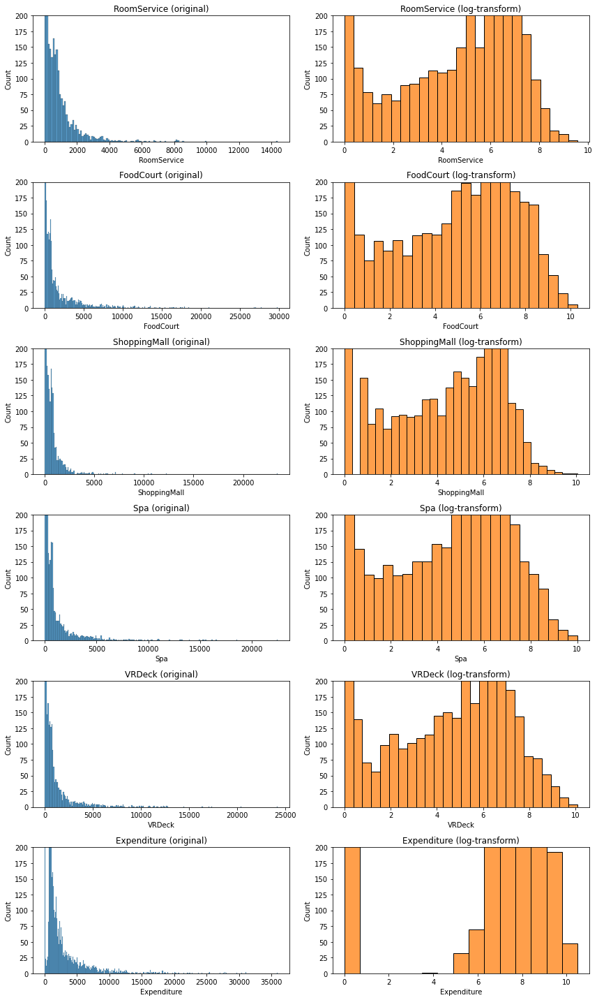

In [206]:
#Plotly did not work here , the plots made by plotly simply didnt look good
fig=plt.figure(figsize=(12,20))
for i, col in enumerate(['RoomService','FoodCourt','ShoppingMall','Spa','VRDeck','Expenditure']):
    plt.subplot(6,2,2*i+1)
    sns.histplot(X[col], binwidth=100)
    plt.ylim([0,200])
    plt.title(f'{col} (original)')
    
    plt.subplot(6,2,2*i+2)
    sns.histplot(np.log(1+X[col]), color='C1')
    plt.ylim([0,200])
    plt.title(f'{col} (log-transform)')
    
fig.tight_layout()
plt.show()

In [207]:
for col in ['RoomService','FoodCourt','ShoppingMall','Spa','VRDeck','Expenditure']:
    X[col]=np.log(1+X[col])
    test_data[col]=np.log(1+test_data[col])

In many machine learning algorithms, to bring all features in the same standing, we need to do scaling so that one significant number doesn't impact the model just because of their large magnitude.

In [208]:
numerical_cols = [cname for cname in X.columns if X[cname].dtype in ['int64', 'float64']]
categorical_cols = [cname for cname in X.columns if X[cname].dtype == "object"]

In [209]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
numerical_transformer = Pipeline(steps=[('scaler', StandardScaler())])


categorical_transformer = Pipeline(steps=[('onehot', OneHotEncoder(drop='if_binary', handle_unknown='ignore',sparse=False))])

ct = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)],
        remainder='passthrough')


X = ct.fit_transform(X)
print('Training set shape:', X.shape)

Training set shape: (8693, 36)


In [210]:
test_data=ct.fit_transform(test_data)

Create test and train sets

In [233]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.33)
np.random.seed(42)

# Model Selection

Top 5 Classification Algorithms:
    
    1. Logistic Regression.
    2. Naive Bayes.
    3. K-Nearest Neighbors.
    4. Random Forest
    5. Light Gradient Boosting Machine (LGBM): 
    6. Categorical Boosting (CatBoost)
    
Now we will train each of this model to see which has the most preliminary accuracy after which we will select the models most suitable

In [252]:
classfiers=["Logistic Regression","Naive Bayes","K-Nearest Neighbors","Random Forest","Light Gradient Boosting machine(LGBM)"]
scores_list=[]

**Logistic regression**

In [253]:
clf=LogisticRegression(random_state=0,max_iter=500)
clf.fit(X_train,y_train)
mscore=clf.score(X_test,y_test)
print("The score is: ",mscore)
scores_list.append(mscore)

The score is:  0.7668177065179506


**Naieve Bayes**

In [254]:
clf=GaussianNB()
clf.fit(X_train,y_train)
mscore=clf.score(X_test,y_test)
print("The score is: ",mscore)
scores_list.append(mscore)

The score is:  0.6786336702683862


**KNN**

In [255]:
clf=KNeighborsClassifier()
clf.fit(X_train,y_train)
mscore=clf.score(X_test,y_test)
print("The score is: ",mscore)
scores_list.append(mscore)

The score is:  0.7678633670268387


**Random Forest Classifier**

In [256]:
clf=RandomForestClassifier()
clf.fit(X_train,y_train)
mscore=clf.score(X_test,y_test)
print("The score is: ",mscore)
scores_list.append(mscore)

The score is:  0.7901707912164517


**Light gradient boosting machine (LGBM)**

In [257]:
clf=LGBMClassifier(random_state=0)
clf.fit(X_train,y_train)
mscore=clf.score(X_test,y_test)
print("The score is: ",mscore)
scores_list.append(mscore)

The score is:  0.8089926803764378


In [279]:
sb=pd.DataFrame(list(zip(classifiers,scores_list)),columns=['Classifier','Score'])

In [280]:
sb

,Classifier,Score
0,LogisticRegression,0.766818
1,KNN,0.678634
2,SVC,0.767863
3,RandomForest,0.790171
4,LGBM,0.808993


In [291]:
#sns.countplot(x=sb['Classifier'])
px.histogram(sb,x='Classifier',y='Score',color_discrete_sequence=[['red','green','blue','yellow','purple']],title='Classifiers and Scores')

**From this, we will take LGBM and Random forest**

# Modelling

Now let's apply Grid search on both of these to get the best parameteres

In [303]:
LGBM_grid = {'n_estimators': [50, 100, 150, 200],
        'max_depth': [4, 8, 12],
        'learning_rate': [0.05, 0.1, 0.15]}

rf_grid={
    "n_estimators":[100,200,300,400],
    "max_depth":[1,2,3,4,5,6,7,8],
    'min_samples_leaf':[2,4]
}
final_class=['LGBM Classifier','Random Forest']
final_scores=[]

In [305]:
LGBM_clf=GridSearchCV(estimator=LGBMClassifier(),param_grid=LGBM_grid,n_jobs=1,cv=5,verbose=True)

#Fit the model
LGBM_clf.fit(X_train,y_train)

#Score and Store the model
final_scores.append(LGBM_clf.score(X_test,y_test))

Fitting 5 folds for each of 36 candidates, totalling 180 fits


In [306]:
rf_clf=GridSearchCV(estimator=RandomForestClassifier(),param_grid=rf_grid,n_jobs=1,cv=5,verbose=True)

#Fit the model
rf_clf.fit(X_train,y_train)

#Score and Store the model
final_scores.append(rf_clf.score(X_test,y_test))

Fitting 5 folds for each of 64 candidates, totalling 320 fits


In [310]:
final_sb=pd.DataFrame(list(zip(final_class,final_scores)),columns=['Classifier','Score'])
final_sb

,Classifier,Score
0,LGBM Classifier,0.810038
1,Random Forest,0.794005


In [316]:
px.histogram(final_sb,x='Classifier',y='Score',color_discrete_sequence=[['orange','red']])

# Submission

In [327]:
pred=LGBM_clf.predict(test_data)

In [337]:
output = pd.DataFrame({'PassengerId': test.PassengerId, 'Transported': pred})
output.to_csv('submission.csv', index=False)
print("Predictions Saved")

Predictions Saved
